## Female education and labour force participation 

**Research question:** Do countries with high female secondary completion rate have higher female labour force participation? 

**Datasett:** World Development Indicators. Source: https://www.kaggle.com/datasets/theworldbank/world-development-indicators

**Supplementary datasetts:**
Country - Region mapping. Source: https://www.kaggle.com/datasets/andradaolteanu/country-mapping-iso-continent-region 
GeoJSON data created by the Natural Earth project. Source:http://geojson.xyz/naturalearth-3.3.0/ne_50m_admin_0_countries.geojson

**Motivation:**

**Findings summary:**

**Acknowledgements:**
Bubble chart inspired by Hans Rosling in Ted Talk: The best stats you've ever seen | Hans Rosling:
https://www.youtube.com/watch?v=hVimVzgtD6w

**References:**
Definitions from the World Bank Metadata Glossary: 
https://databank.worldbank.org/metadataglossary/all/series

Python Folium: Create Web Maps From Your Data: 
https://realpython.com/python-folium-web-maps-from-data/


## Importing libraries 

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


## Initial Data Exploration
* data shape
* data contents
* See relevant variables for analysis 

In [30]:
df= pd.read_csv('Data\WDIData.csv')
print(df.shape)
display(df.sample(4))

(422136, 64)


,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,Unnamed: 63
416794,West Bank and Gaza,PSE,"Personal remittances, received (% of GDP)",BX.TRF.PWKR.DT.GD.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,10.401986,10.909407,15.400195,12.014207,14.191563,14.407475,15.608026,14.780405,NaN,NaN
87666,Argentina,ARG,Ratio of female to male labor force participat...,SL.TLF.CACT.FM.NE.ZS,27.559615,NaN,NaN,NaN,NaN,NaN,...,65.047703,64.809787,65.597550,65.396185,65.850978,NaN,NaN,67.694246,NaN,NaN
39727,Least developed countries: UN classification,LDC,"School enrollment, preprimary (% gross)",SE.PRE.ENRR,NaN,NaN,NaN,NaN,NaN,NaN,...,14.670410,16.894400,19.199921,20.430691,21.069300,21.916590,23.373871,24.373550,NaN,NaN
153150,Croatia,HRV,"Prevalence of overweight, weight for height, m...",SH.STA.OWGH.MA.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
# What indicators could I assess? 
# I search for string values for words to find a suiting indicators
indicators_female = df.query('`Indicator Name`.str.contains("female")==True')['Indicator Name'].unique().tolist()
indicators_female

['Account ownership at a financial institution or with a mobile-money-service provider, female (% of population ages 15+)',
 'Adjusted net enrollment rate, primary, female (% of primary school age children)',
 'Adolescents out of school, female (% of female lower secondary school age)',
 'Average working hours of children, study and work, female, ages 7-14 (hours per week)',
 'Average working hours of children, working only, female, ages 7-14 (hours per week)',
 'Child employment in agriculture, female (% of female economically active children ages 7-14)',
 'Child employment in manufacturing, female (% of female economically active children ages 7-14)',
 'Child employment in services, female (% of female economically active children ages 7-14)',
 'Children in employment, female (% of female children ages 7-14)',
 'Children in employment, self-employed, female (% of female children in employment, ages 7-14)',
 'Children in employment, study and work, female (% of female children in empl

I select two variables I wish to further analyse, and then I check the World Bank metadata glossary to understand the variables.

## Selected variables defintition: 

**Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)**

_"Labor force participation rate is the proportion of the population ages 15 and older that is economically active: all people who supply labor for the production of goods and services during a specified period."_

**Lower secondary completion rate, female (%)**
**Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)**:
_"The percentage of population ages 25 and over that attained or completed lower secondary education."_

_"Lower secondary education completion rate is measured as the gross intake ratio to the last grade of lower secondary education (general and pre-vocational). It is calculated as the number of new entrants in the last grade of lower secondary education, regardless of age, divided by the population at the entrance age for the last grade of lower secondary education."_

Definitions from the World Bank Metadata Glossary: 
https://databank.worldbank.org/metadataglossary/all/series

## Data cleaning 

In [32]:
# storing the selected variables in a list 
indicators = ["Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)","Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)"]

In [33]:
# For ease, I replace space with underscore in the column names
df.columns = [c.replace(' ', '_') for c in df.columns]

In [34]:
df.head()

,Country_Name,Country_Code,Indicator_Name,Indicator_Code,1960,1961,1962,1963,1964,1965,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,Unnamed:_63
0,Arab World,ARB,"2005 PPP conversion factor, GDP (LCU per inter...",PA.NUS.PPP.05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"2005 PPP conversion factor, private consumptio...",PA.NUS.PRVT.PP.05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,Access to clean fuels and technologies for coo...,EG.CFT.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,82.407647,82.827636,83.169227,83.587141,83.954293,84.230630,84.570425,NaN,NaN,NaN
3,Arab World,ARB,Access to electricity (% of population),EG.ELC.ACCS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,86.136134,86.782683,87.288244,88.389705,88.076774,88.517967,88.768654,NaN,NaN,NaN
4,Arab World,ARB,"Access to electricity, rural (% of rural popul...",EG.ELC.ACCS.RU.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,74.543489,75.770972,76.772916,78.839139,77.487377,78.564439,78.958780,NaN,NaN,NaN


In [35]:
# Noticing there are non countries in the country variable, wish as "Arab World" and "World" 
# Open the csv file and see that non countries are listed first until the first country is listed at index 75154
# I therefore slice the dataset from this observation to only include countries in the data

# select only the indicators I will analyse
# drop columns not needed 

fdf = (
    df.loc[75154:]
    .query('Indicator_Name in @indicators')
    .drop(columns=['Country_Code','Indicator_Code'])
)

In [36]:
# Make a long dataframe 
stack_df = (
    fdf.set_index(['Country_Name','Indicator_Name'])
   .stack()
   .reset_index()
   .rename({'level_2': 'Year', 0:'Value'}, axis=1)
   )
#.pivot_table(index=['Country_Name','Year'], columns='Indicator_Name', values='Value')
stack_df.head()

,Country_Name,Indicator_Name,Year,Value
0,Afghanistan,"Educational attainment, at least completed low...",1975,1.401440
1,Afghanistan,"Educational attainment, at least completed low...",1979,0.803100
2,Afghanistan,"Labor force participation rate, female (% of f...",1990,44.348000
3,Afghanistan,"Labor force participation rate, female (% of f...",1991,44.359001
4,Afghanistan,"Labor force participation rate, female (% of f...",1992,44.365002


In [37]:
# Make a wide table to summarise the two variables with describe()
long_df = stack_df.pivot_table(index=['Country_Name','Year'], columns='Indicator_Name', values='Value').reset_index()
long_df

Indicator_Name,Country_Name,Year,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)","Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)"
0,Afghanistan,1975,1.40144,NaN
1,Afghanistan,1979,0.80310,NaN
2,Afghanistan,1990,NaN,44.348000
3,Afghanistan,1991,NaN,44.359001
4,Afghanistan,1992,NaN,44.365002
...,...,...,...,...
5639,Zimbabwe,2014,52.47886,78.791000
5640,Zimbabwe,2015,NaN,78.925003
5641,Zimbabwe,2016,NaN,79.082001
5642,Zimbabwe,2017,NaN,79.261002


In [38]:
# Making shorter label names for the variables
indicator_label = [x.split("(",1)[0] for x in indicators]
indicator_label = ['Labor force participation rate (female)',
 'Completed secondary education rate (female)']

In [39]:
# remove years with missing data in at least one of the indicators 
print(f"Total observations: {len(long_df)}")
cdf = long_df.dropna()
print(f"Observations after removing observations with missing: {len(cdf)}")
# Where does missing data occur? 
display(long_df.isna().value_counts())

Total observations: 5644
Observations after removing observations with missing: 839


Country_Name  Year   Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)  Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)
False         False  True                                                                                                 False                                                                                                4584
                     False                                                                                                False                                                                                                 839
                                                                                                                          True                                                                                                  221
Name: count, dtype: int64

### Notes on missing data: 
- Most missingness occurs in the "Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)"
- The reason missing data occur might be because the indicator data is collected in national survey which might not necessarily be completed every year. From the World Bank Metadata glossary: _"Data are collected by the UNESCO Institute for Statistics mainly from national population census, household survey, and labour force survey."_
- There is no missing data for year or country
- Only 221 countries have missingness in the labour force participation variable

# Data exploration 

In [40]:
# look at cleaned dataframe called cdf
cdf.head()

Indicator_Name,Country_Name,Year,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)","Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)"
42,Albania,2001,70.99655,56.341999
49,Albania,2008,78.76185,52.717999
52,Albania,2011,82.15253,54.173000
53,Albania,2012,85.21604,55.701000
77,Algeria,2006,20.89734,14.120000


In [41]:
# Show countries with most and least observations 
cdf.groupby(['Country_Name'])['Year'].count().sort_values(ascending=False)

Country_Name
Portugal                 20
Sweden                   19
Cyprus                   14
Singapore                14
Mexico                   14
                         ..
Estonia                   1
Cote d'Ivoire             1
Canada                    1
South Sudan               1
Sao Tome and Principe     1
Name: Year, Length: 149, dtype: int64

In [42]:
print(f"Range of years in the dataframe is: {cdf.Year.min()} - {cdf.Year.max()}")

Range of years in the dataframe is: 1990 - 2017


In [43]:
cdf.describe()

Indicator_Name,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)","Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)"
count,839.000000,839.000000
mean,63.127458,57.396665
std,26.187131,14.997656
min,0.941760,12.567000
25%,44.449375,50.133001
50%,64.770480,59.876999
75%,87.458355,67.768497
max,100.000000,91.947998


In [44]:
print(f"Country/year with the lowest and higest {indicator_label[0]}\n")
print(f"---- Lowest {indicator_label[0]} -----")
display(cdf.nsmallest(3, indicators[0]).drop(columns=indicators[1])
        .style.hide()
        .format(precision=2)
        .set_table_styles([dict(selector="th",props=[('max-width', '350px')])]))
print(f"---- Highest {indicator_label[0]} -----n")
display(cdf.nlargest(3, indicators[0]).drop(columns=indicators[1])
        .style.hide()
        .format(precision=2)
        .set_table_styles([dict(selector="th",props=[('max-width', '350px')])]))

Country/year with the lowest and higest Labor force participation rate (female)

---- Lowest Labor force participation rate (female) -----


Country_Name,Year,"Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)"
Jordan,2003,12.57
Iraq,2013,12.60
Syrian Arab Republic,2009,13.75


---- Highest Labor force participation rate (female) -----n


Country_Name,Year,"Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)"
Burundi,1990,91.95
Tanzania,2002,86.91
Rwanda,2010,85.07


In [45]:
print(f"Country/year with the lowest and higest {indicator_label[1]}\n")
print(f"---- Lowest {indicator_label[1]} -----")
display(cdf.nsmallest(3, indicators[1]).drop(columns=indicators[0])
        .style.hide()
        .format(precision=2)
        .set_table_styles([dict(selector="th",props=[('max-width', '350px')])]))
print(f"---- Highest {indicator_label[1]} -----")
display(cdf.nlargest(3, indicators[1]).drop(columns=indicators[0])
        .style.hide()
        .format(precision=2)
        .set_table_styles([dict(selector="th",props=[('max-width', '350px')])]))

Country/year with the lowest and higest Completed secondary education rate (female)

---- Lowest Completed secondary education rate (female) -----


Country_Name,Year,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)"
Burkina Faso,2007,0.94
Burundi,1990,1.77
Tanzania,2002,4.16


---- Highest Completed secondary education rate (female) -----


Country_Name,Year,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)"
Denmark,2004,100.00
Denmark,2008,100.00
Latvia,2016,100.00


In [46]:
# Find the year with the most observations
year = cdf.Year.value_counts().index[0]
print(f"The year with the most observations without missing data is: {year}")

The year with the most observations without missing data is: 2010


# Data visualisation 
I have selected the year with most observations, 2010, and will show different figures that will explain... using the Matplot library. 

To show correlaiton between the two variables I show a scatter plot with a regression line. I will also show the correlation coefficient between the vairables and then describe what the figure and correlaiton coefficient can tell me. 

Next, I will visualise the rates of Female secondaary complation rate and Labour force participation in the world using the Folium package by adding a colored overlay of the world map. 

After, I will a line chart to visualise how the two rates have developed over time for all the countries in the cleaned dataframe. 


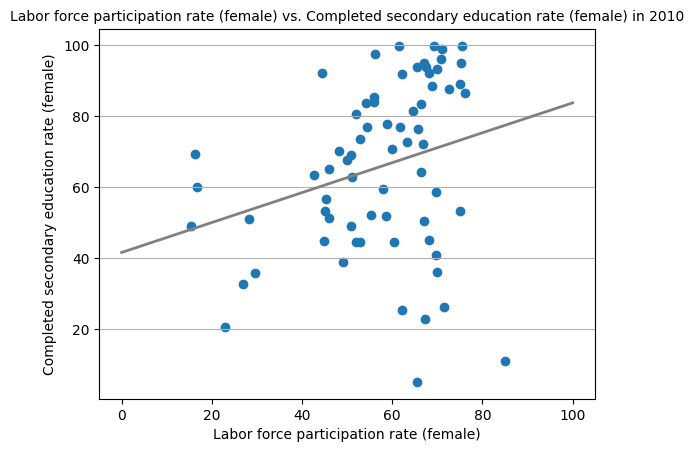

In [47]:
# Scatter plot 

fig, axis = plt.subplots()

axis.yaxis.grid(True)
axis.set_title(f"{indicator_label[0]} vs. {indicator_label[1]} in {year}",fontsize=10)
axis.set_xlabel(indicator_label[0],fontsize=10)
axis.set_ylabel(indicator_label[1],fontsize=10)
 
axis.scatter(cdf.query('Year == @year')[indicators[0]].values,
            cdf.query('Year == @year')[indicators[1]].values)


# Adding a regression line to the
b, a = np.polyfit(cdf.query('Year == @year')[indicators[0]].values,
            cdf.query('Year == @year')[indicators[1]].values, deg=1)

# Create sequence of 100 numbers from 0 to 100 
xseq = np.linspace(0, 100, num=100)

# Plot regression line
axis.plot(xseq, a + b * xseq, color="#808080", lw=2);
plt.show()

In [48]:
# Correlation coefficient
corr_coeff = np.corrcoef(cdf.query('Year == @year')[indicators[0]].values,
            cdf.query('Year == @year')[indicators[1]].values)[0, 1]
print(f"The correlation coefficient is: {np.round(corr_coeff,3)}")


The correlation coefficient is: 0.266


### What does the correlation coefficient tell us? 
With the positive correlaiton coefficient we see that there is a positive relationship. Meaning, countries with higher Female Education rate have higher female labour force participation. In the summary section of the notebook I will disscuss what we can inferr from these results. 



### Visualising the variables on a world map
### **Color coded map using Folium**

In [49]:
import folium
import pandas as pd

eco_footprints = pd.read_csv("C:/ENV/Læring/DataSci/Week5-Visualization/Data/footprint.csv")
political_countries_url = (
    "http://geojson.xyz/naturalearth-3.3.0/ne_50m_admin_0_countries.geojson"
)

m = folium.Map(location=(40, 10), zoom_start=2)
folium.Choropleth(
    geo_data=political_countries_url,
    data=cdf.query('Year == @year'),
    columns=['Country_Name',indicators[1]],
    key_on="feature.properties.name",
    fill_color='Purples', fill_opacity=1, line_opacity=0.2,
    nan_fill_color="white",
    name = f"{indicator_label[1]} in {year}",
    legend_name=indicator_label[1]).add_to(m) 


folium.Choropleth(
    geo_data=political_countries_url,
    data=cdf.query('Year == @year'),
    columns=['Country_Name',indicators[0]],
    key_on="feature.properties.name",
    fill_color='Greens', fill_opacity=1, line_opacity=0.2,
    nan_fill_color="white",
    name = f"{indicator_label[0]} in {year}",
    legend_name=indicator_label[0]).add_to(m) 

folium.LayerControl().add_to(m)

print(f"Countries in {year} by {indicator_label[0]} and {indicator_label[1]}")
print("Select the layers button in the top right corner to change the variable shown on the map")
display(m)

Countries in 2010 by Labor force participation rate (female) and Completed secondary education rate (female)
Select the layers button in the top right corner to change the variable shown on the map


## Visualising development over time 
### **Line chart using Matplotlib**

In [61]:
cdf

Indicator_Name,Country_Name,Year,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)","Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)"
42,Albania,2001,70.99655,56.341999
49,Albania,2008,78.76185,52.717999
52,Albania,2011,82.15253,54.173000
53,Albania,2012,85.21604,55.701000
77,Algeria,2006,20.89734,14.120000
...,...,...,...,...
5586,Zambia,1990,13.08102,74.061996
5617,Zimbabwe,1992,16.54818,74.152000
5627,Zimbabwe,2002,37.11177,75.273003
5637,Zimbabwe,2012,55.28325,78.512001


In [66]:
len(cdf.Country_Name.unique().tolist())

149

In [97]:
countries = cdf.Country_Name.unique().tolist()

In [88]:
cdf['Year'] = cdf['Year'].astype(float)

C:\Users\lal\AppData\Local\Temp\ipykernel_9432\302891508.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [128]:
cdf_region.dropna().region.unique().tolist()

['Europe', 'Africa', 'Americas', 'Asia', 'Oceania']

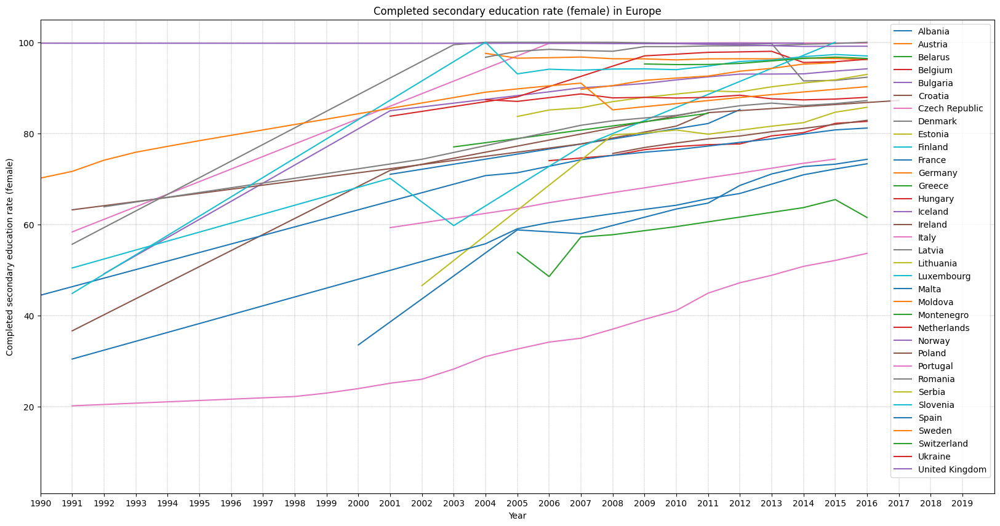

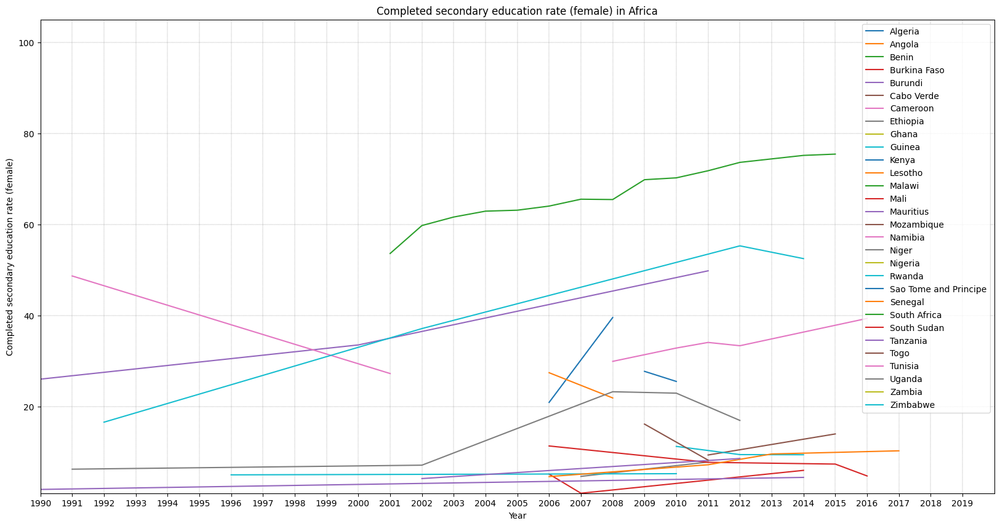

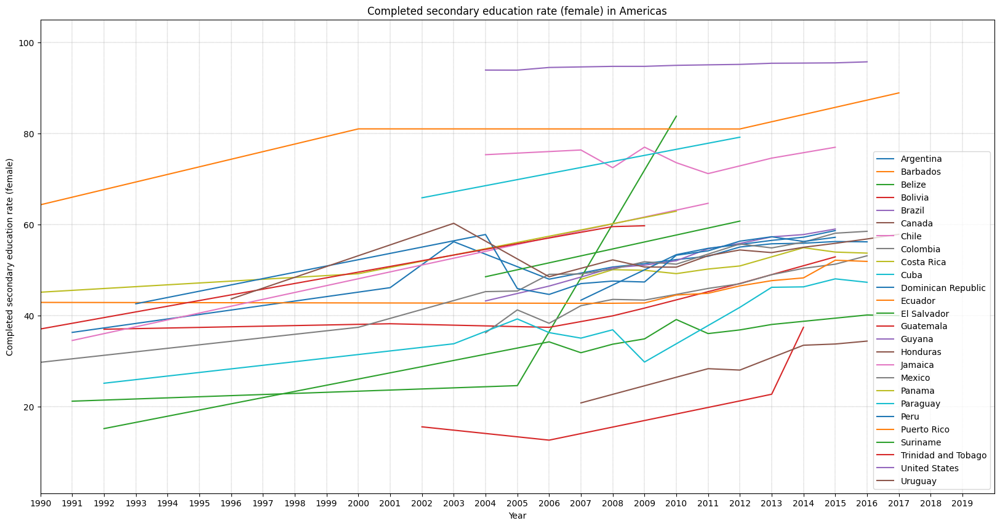

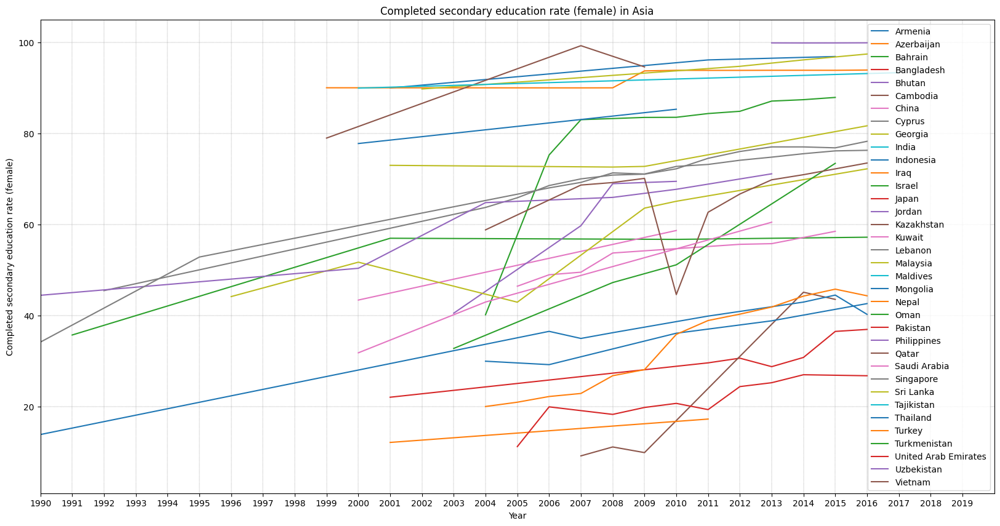

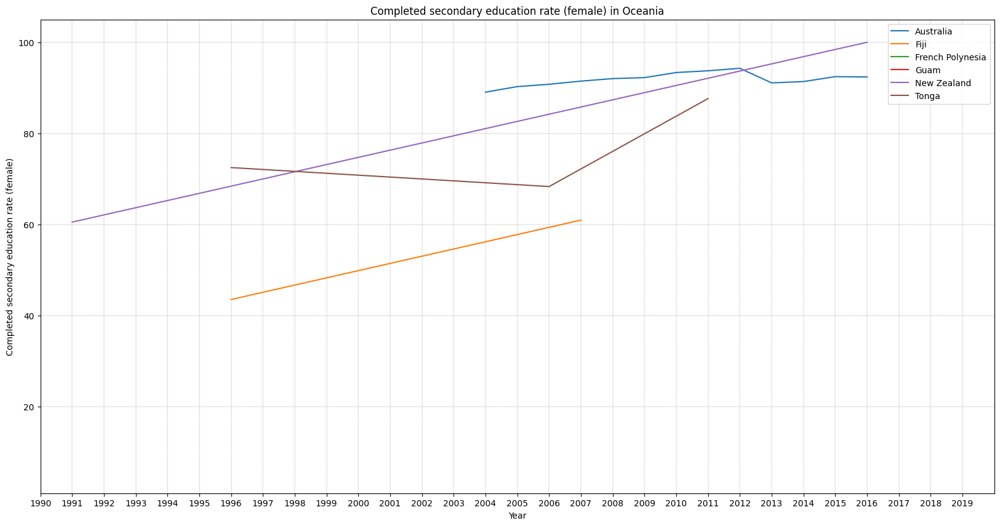

In [131]:
# Loop through unique regions to make a plot for each region 

for region in cdf_region.dropna().region.unique().tolist(): 
    fig, ax = plt.subplots(figsize=(20, 10))
    ax.set_title(f"{indicator_label[1]} in {region}")
    ax.set_ylim(cdf[indicators[1]].min(), cdf[indicators[1]].max()+5)
    ax.set_xlim(cdf['Year'].min(), (cdf['Year'].max()+3))
    plt.xticks(np.arange(cdf['Year'].min(), (cdf['Year'].max()+3), 1))
    ax.set_xlabel('Year')
    ax.set_ylabel(indicator_label[1])
    
    plt.grid(color = 'grey', linestyle = '--', linewidth = 0.3)

    # filter region and loop through countries in regions to plot each country 
    region_cdf = cdf_region.query('region==@region')
    countries_region = region_cdf.Country_Name.unique().tolist()

    for country in countries_region:
        cdf_loop = cdf.query('Country_Name == @country').sort_values(by='Year')
        ax.plot(cdf_loop['Year'], cdf_loop[indicators[1]], label=country)
        ax.legend()

    plt.show()

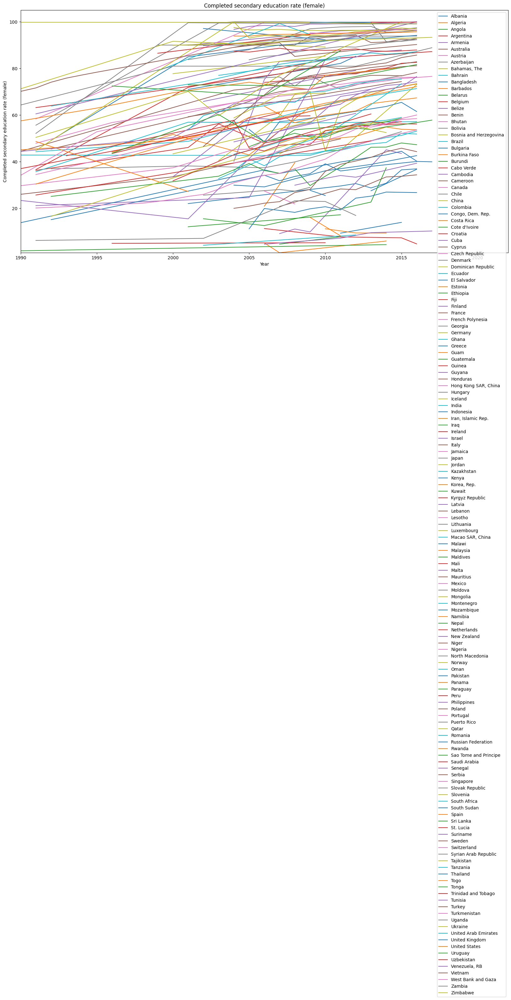

In [98]:
fig, ax = plt.subplots(figsize=(20, 10))
ax.set_title(f"{indicator_label[1]}")
# Set appropriate limits if needed
ax.set_ylim(cdf[indicators[1]].min(), cdf[indicators[1]].max()+5)
ax.set_xlim(cdf['Year'].min(), cdf['Year'].max()+5)


for country in countries:
    cdf_loop = cdf.query('Country_Name == @country').sort_values(by='Year')
    ax.plot(cdf_loop['Year'], cdf_loop[indicators[1]], label=country)

ax.set_xlabel('Year')
ax.set_ylabel(indicator_label[1])
ax.legend()
plt.show()

# ax.plot(cdf_loop.query('Country_Name == @countries[0]')['Year'], cdf_loop.query('Country_Name == @countries[0]')[indicators[1]], label=countries[0])
# ax.plot(cdf_loop.query('Country_Name == @countries[1]')['Year'], cdf_loop.query('Country_Name == @countries[1]')[indicators[1]], label=countries[1])

# Adding labels and title
ax.set_xlabel('Year')
ax.set_ylabel(indicator_label[1])
ax.legend()
plt.show()

Indicator_Name Country_Name  Year  \
3215                  Malta  2000   
3220                  Malta  2005   
3222                  Malta  2007   
3225                  Malta  2010   
3226                  Malta  2011   
3227                  Malta  2012   
3228                  Malta  2013   
3229                  Malta  2014   
3230                  Malta  2015   
3231                  Malta  2016   

Indicator_Name  Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)  \
3215                                                     33.51877                                                     
3220                                                     58.78282                                                     
3222                                                     57.95228                                                     
3225                                                     63.37577                                                   

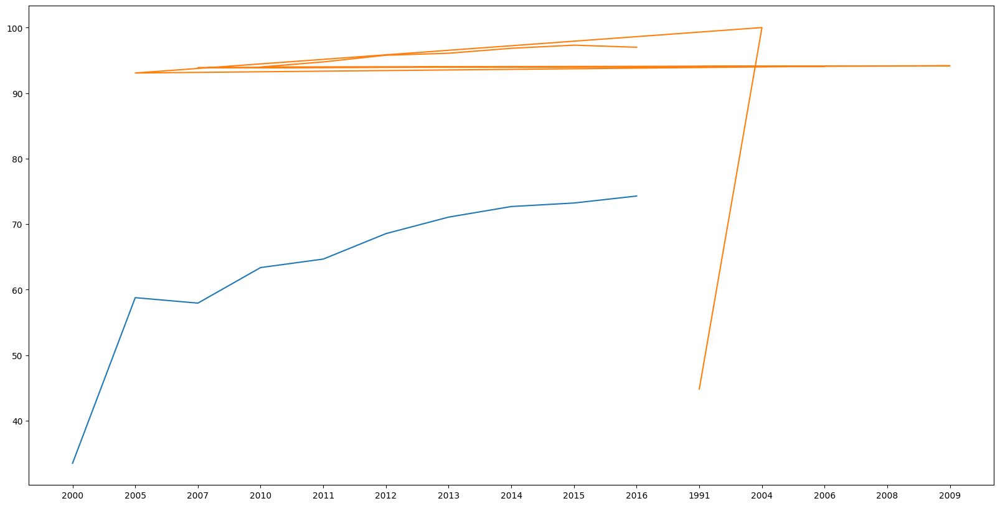

In [81]:
fig, ax = plt.subplots(figsize=(20, 10))
# ax.set_title(f"{indicator_label[1]}")
# ax.set_ylim(min(0,cdf[indicators[1]].min()), cdf[indicators[1]].max())
# ax.set_xlim(min(0,cdf['Year'].min()), cdf['Year'].max())

for country in countries: 
    cdf_loop = cdf.query('Country_Name==@country').sort_values(by='Year')
    print(cdf_loop)
    ax.plot(cdf_loop['Year'], cdf_loop[indicators[1]] ) 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


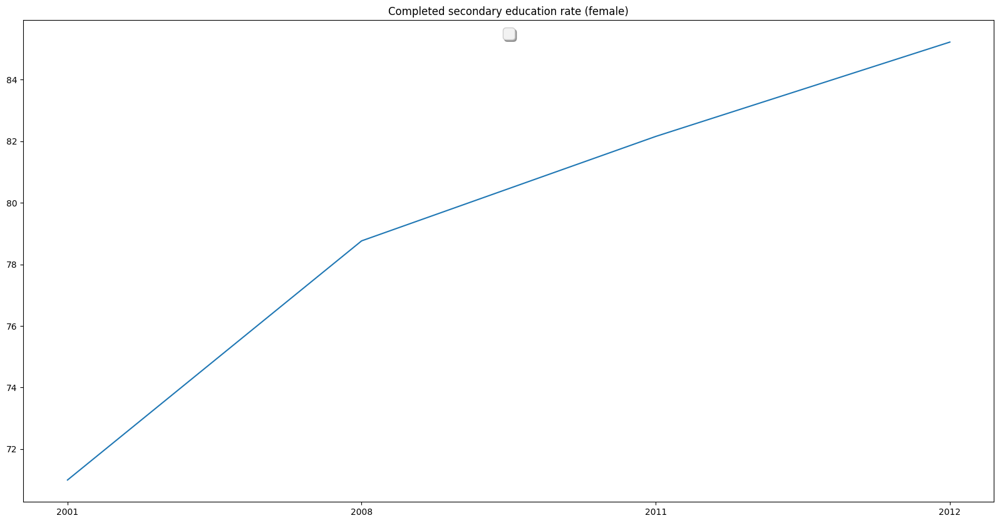

In [62]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(20, 10))

    # data=cdf.query('Year == @year'),
    # columns=['Country_Name',indicators[1]],


# ax.set_ylim(min(0,filteredData1['Value'].min()), 2*filteredData1['Value'].max())
ax.set_title(f"{indicator_label[1]}")
ax.plot(cdf.query('Country_Name=="Albania"')['Year'], cdf.query('Country_Name=="Albania"')[indicators[1]] ) 

# Add the legend
legend = plt.legend(loc = 'upper center', 
                    shadow=True,
                    prop={'weight':'roman','size':'xx-large'})

# Rectangle around the legend
frame = legend.get_frame()
frame.set_facecolor('.95')
plt.show()

### Visualising Population size, Female Labour force participation and Female secondary education completion 
#### **Bubble chart with Plotly**

Inspired by Hans Rosling I wish to make a bubble chart with size representing populaiton size and colour region. 
I will therefore use data with country and region mapping to add region and I will add population size from the World Bank Data to my cleaned dataframe. 

I use Plotly because of it's interactivcity, as the user can hover over and see the country for an observation. 

**Data preperation steps**: 
- add country - region mapping using mapping from data source: https://www.kaggle.com/datasets/andradaolteanu/country-mapping-iso-continent-region 
- Select the Wolrd Bank dataframe indicator "Population, total" and make a stacked dataframe. Then I merge the stacked population dataframe with the cleaned dataframe.  


In [100]:
## add country - region mapping using mapping from data source: https://www.kaggle.com/datasets/andradaolteanu/country-mapping-iso-continent-region 
regiondf = pd.read_csv("C:\ENV\Læring\DataSci\Week5-Visualization\Data\continents2.csv")
regiondf.head()

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
1,Åland Islands,AX,ALA,248,ISO 3166-2:AX,Europe,Northern Europe,NaN,150.0,154.0,NaN
2,Albania,AL,ALB,8,ISO 3166-2:AL,Europe,Southern Europe,NaN,150.0,39.0,NaN
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,Africa,Northern Africa,NaN,2.0,15.0,NaN
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,Oceania,Polynesia,NaN,9.0,61.0,NaN


In [101]:
# Merge region information to cleaned dataframe
cdf_region = (
    cdf.merge(regiondf[['name','region']], left_on = 'Country_Name', right_on='name', how='left')
    .drop(columns='name')
)
cdf_region.head()

,Country_Name,Year,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)","Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)",region
0,Albania,2001.0,70.99655,56.341999,Europe
1,Albania,2008.0,78.76185,52.717999,Europe
2,Albania,2011.0,82.15253,54.173000,Europe
3,Albania,2012.0,85.21604,55.701000,Europe
4,Algeria,2006.0,20.89734,14.120000,Africa


In [53]:
# Add population size information to cleaned dataframe
population_df = (
     df.query('Indicator_Name.str.contains("Population, total")==True')
    .drop(columns=['Country_Code', 'Indicator_Code'])
) 
population_stack = (
    population_df
    .set_index(['Country_Name','Indicator_Name'])
   .stack()
   .reset_index()
   .rename({'level_2': 'Year', 0:'Population_Value'}, axis=1)
   )
population_stack

,Country_Name,Indicator_Name,Year,Population_Value
0,Arab World,"Population, total",1960,92490932.0
1,Arab World,"Population, total",1961,95044497.0
2,Arab World,"Population, total",1962,97682294.0
3,Arab World,"Population, total",1963,100411076.0
4,Arab World,"Population, total",1964,103239902.0
...,...,...,...,...
15142,Zimbabwe,"Population, total",2013,15054506.0
15143,Zimbabwe,"Population, total",2014,15411675.0
15144,Zimbabwe,"Population, total",2015,15777451.0
15145,Zimbabwe,"Population, total",2016,16150362.0


In [54]:
## add population size for bubble chart
cdf_region_pop = (
    cdf_region.merge(population_stack[['Country_Name', 'Year','Population_Value']],
                    on=['Country_Name', 'Year'], how='left')
)
cdf_region_pop

,Country_Name,Year,"Educational attainment, at least completed lower secondary, population 25+, female (%) (cumulative)","Labor force participation rate, female (% of female population ages 15-64) (modeled ILO estimate)",region,Population_Value
0,Albania,2001,70.99655,56.341999,Europe,3060173.0
1,Albania,2008,78.76185,52.717999,Europe,2947314.0
2,Albania,2011,82.15253,54.173000,Europe,2905195.0
3,Albania,2012,85.21604,55.701000,Europe,2900401.0
4,Algeria,2006,20.89734,14.120000,Africa,33777915.0
...,...,...,...,...,...,...
834,Zambia,1990,13.08102,74.061996,Africa,8027253.0
835,Zimbabwe,1992,16.54818,74.152000,Africa,10682868.0
836,Zimbabwe,2002,37.11177,75.273003,Africa,12500525.0
837,Zimbabwe,2012,55.28325,78.512001,Africa,14710826.0


In [55]:
import plotly.express as px

fig = px.scatter(cdf_region_pop.query('Year == @year'), x=indicators[0], y=indicators[1],
	         size="Population_Value", color="region",
                 hover_name="Country_Name", log_x=True, size_max=60)

# update layout 
fig.update_layout(
    title=f"{indicator_label[0]} vs {indicator_label[1]} in {year}",
    xaxis=dict(
        title=indicator_label[0],
        gridcolor='rgb(243, 243, 243)',
        type='log',
        gridwidth=2,
    ),
    yaxis=dict(
        title=indicator_label[1],
        gridcolor='rgb(243, 243, 243)',
        gridwidth=2,
    ),
    paper_bgcolor='white',
    plot_bgcolor='white'
    ) 

fig.show()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

## Using interactive components of Plotly figure to understand outliers
- some countries not following the trend
- African countries with very lov educaiton but very high labour force participation
- zooming in on the higest education we see Norway high on both, but czec with slightly higher education but have many percent lower participaiton


## Conclusions 

-
-
***Correlation does not mean causation*** - there might be other causes or contributing factors for this relationship. Higher education and more labour force participation amongst women is a trend seen in many countries and there might be other factors leading to higher female labour force participation. 

## Next steps
- Only viewed one year. It would be interesting to analyse other years or include interactive figures where user can select the year of interest
- Only viewer aggregated country correlation. But it would be interesting to see the relationship between variables within countries